# Analysis and visualization of spatial transcriptomics data

**Author:** Giovanni Palla

* This tutorial demonstrates how to work with spatial transcriptomics data within Scanpy.
* We focus on 10x Genomics [Visium](https://www.10xgenomics.com/spatial-transcriptomics/) data, and provide an example for [MERFISH](#MERFISH-example).

In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
%load_ext lab_black
%load_ext autoreload
%autoreload 2

In [3]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

scanpy==1.4.7.dev65+gc6cb97c0 anndata==0.7.2.dev83+g5e459ab umap==0.4.2 numpy==1.18.4 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.0


## Reading the data

We will use a Visium spatial transcriptomics dataset of the human lymphnode, which is publicly available from the 10x genomics website: [link](https://support.10xgenomics.com/spatial-gene-expression/datasets/1.0.0/V1_Human_Lymph_Node).

The function [datasets.visium_sge()](https://scanpy.readthedocs.io/en/latest/api/scanpy.datasets.visium_sge.html) downloads the dataset from 10x Genomics and returns an `AnnData` object that contains counts, images and spatial coordinates. We will calculate standards QC metrics with [pp.calculate_qc_metrics](https://scanpy.readthedocs.io/en/latest/api/scanpy.pp.calculate_qc_metrics.html) and percentage of mitochondrial read counts per sample.

When using your own Visium data, use [sc.read_visium()](https://scanpy.readthedocs.io/en/latest/api/scanpy.read_visium.html) function to import it.

In [4]:
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)


reading /Users/giovanni.palla/Projects/scanpy-tutorials/spatial/data/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/Users/giovanni.palla/miniconda3/envs/sc_dev/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:355: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 11000. The TBB threading layer is disabled.
  warnings.warn(problem)


This is how the adata structure looks like for Visium data

In [5]:
adata

AnnData object with n_obs × n_vars = 4039 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'coords'

## QC and preprocessing

We perform some basic filtering of spots based on total counts and expressed genes

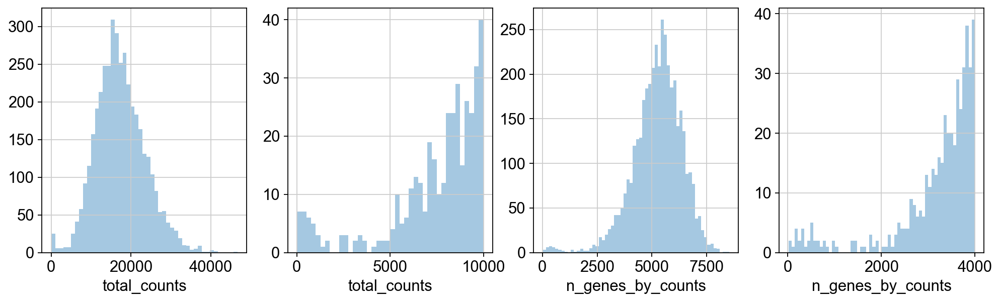

In [5]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.distplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)

In [6]:
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20]
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

filtered out 51 cells that have less than 5000 counts
filtered out 26 cells that have more than 35000 counts
#cells after MT filter: 3962
filtered out 15071 genes that are detected in less than 10 cells


Trying to set attribute `.var` of view, copying.


We proceed to normalize Visium counts data with the built-in `normalize_total` method from Scanpy, and detect highly-variable genes (for later). Note that there are alternatives for normalization (see discussion in [[Luecken19](https://www.embopress.org/doi/full/10.15252/msb.20188746)], and more recent alternatives such as [SCTransform](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1874-1) or [GLM-PCA](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1861-6)).

In [7]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


## Manifold embedding and clustering based on transcriptional similarity

To embed and cluster the manifold encoded by transcriptional similarity, we proceed as in the standard clustering tutorial.

In [8]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
running Leiden clustering
    finished: found 9 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


We plot some covariates to check if there is any particular structure in the UMAP associated with total counts and detected genes.

... storing 'feature_types' as categorical
... storing 'genome' as categorical


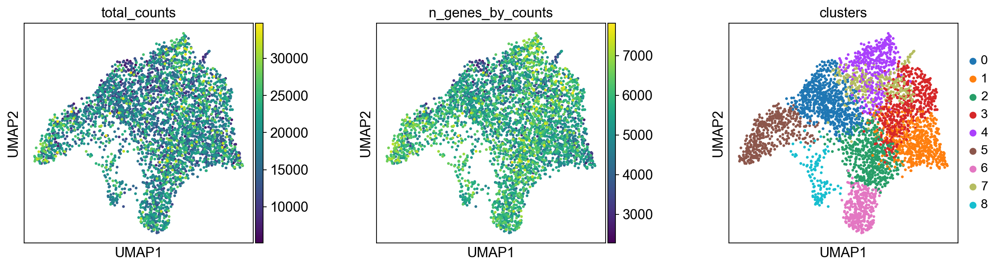

In [9]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

## Visualization in spatial coordinates

Let us now take a look at how `total_counts` and `n_genes_by_counts` behave in spatial coordinates. We will overlay the circular spots on top of the Hematoxylin and eosin stain (H&E) image provided, using the function [sc.pl.spatial](https://scanpy.readthedocs.io/en/latest/api/scanpy.pl.spatial.html).

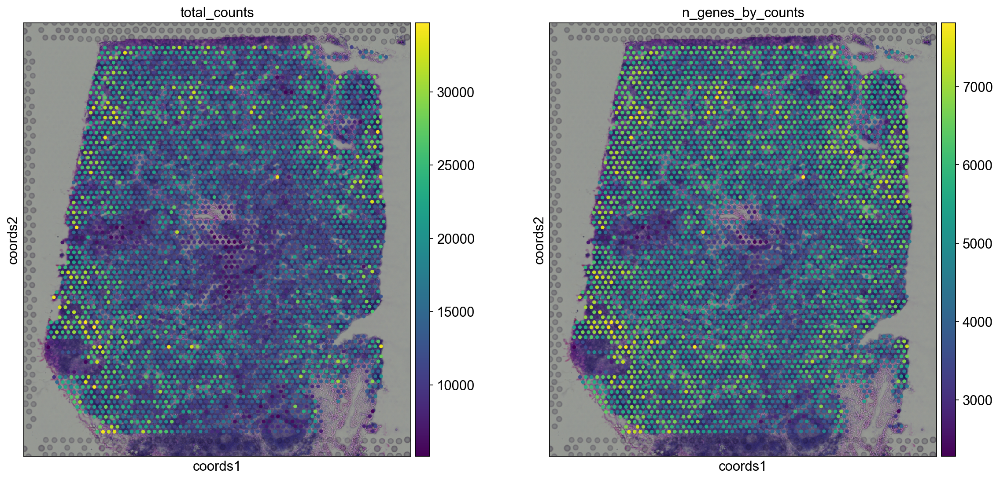

In [10]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

The function [sc.pl.spatial](https://scanpy.readthedocs.io/en/latest/api/scanpy.pl.spatial.html) accepts 4 additional parameters:

* `img_key`: key where the img is stored in the `adata.uns` element
* `crop_coord`: coordinates to use for cropping (left, right, top, bottom)
* `alpha_img`: alpha value for the transcparency of the image
* `bw`: flag to convert the image into gray scale  

Furthermore, in [sc.pl.spatial](https://scanpy.readthedocs.io/en/latest/api/scanpy.pl.spatial.html), the `size` parameter changes its behaviour: it becomes a scaling factor for the spot sizes.

Before, we performed clustering in gene expression space, and visualized the results with UMAP. By visualizing clustered samples in spatial dimensions, we can gain insights into tissue organization and, potentially, into inter-cellular communication.

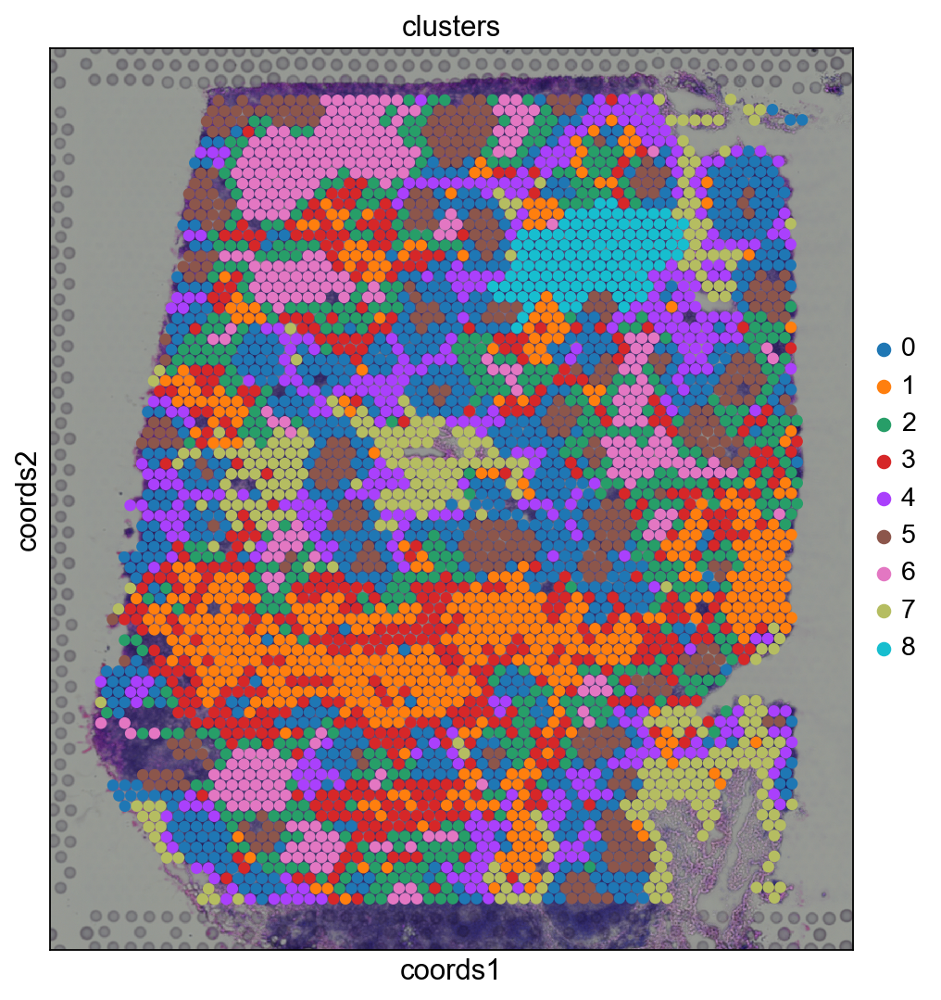

In [11]:
sc.pl.spatial(adata, img_key="hires", color="clusters", size=1.5)

Spots belonging to the same cluster in gene expression space often co-occur in spatial dimensions. For instance, spots belonging to cluster 5 are often surrounded by spots belonging to cluster 0.

We can zoom in specific regions of interests to gain qualitative insights. Furthermore, by changing the alpha values of the spots, we can visualize better the underlying tissue morphology from the H&E image.

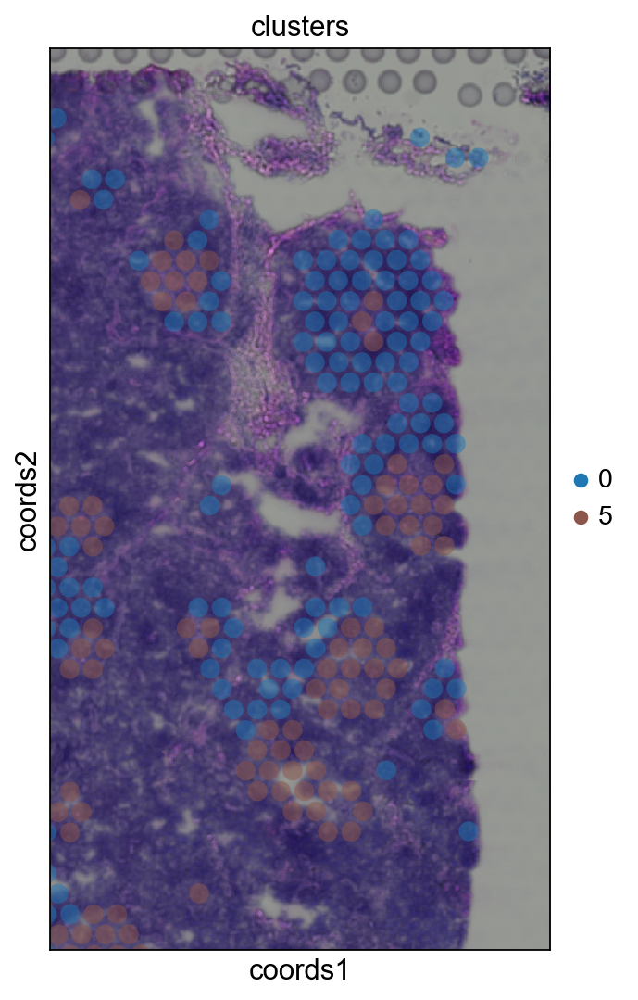

In [12]:
sc.pl.spatial(
    adata,
    img_key="hires",
    color="clusters",
    groups=["0", "5"],
    crop_coord=[1200, 1700, 1900, 1000],
    alpha=0.5,
    size=1.3,
)

## Cluster marker genes

Let us further inspect cluster 5, which occurs in small groups of spots across the image.

Compute marker genes and plot a heatmap with expression levels of its top 10 marker genes across clusters.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters']`
categories: 0, 1, 2, etc.
var_group_labels: 5


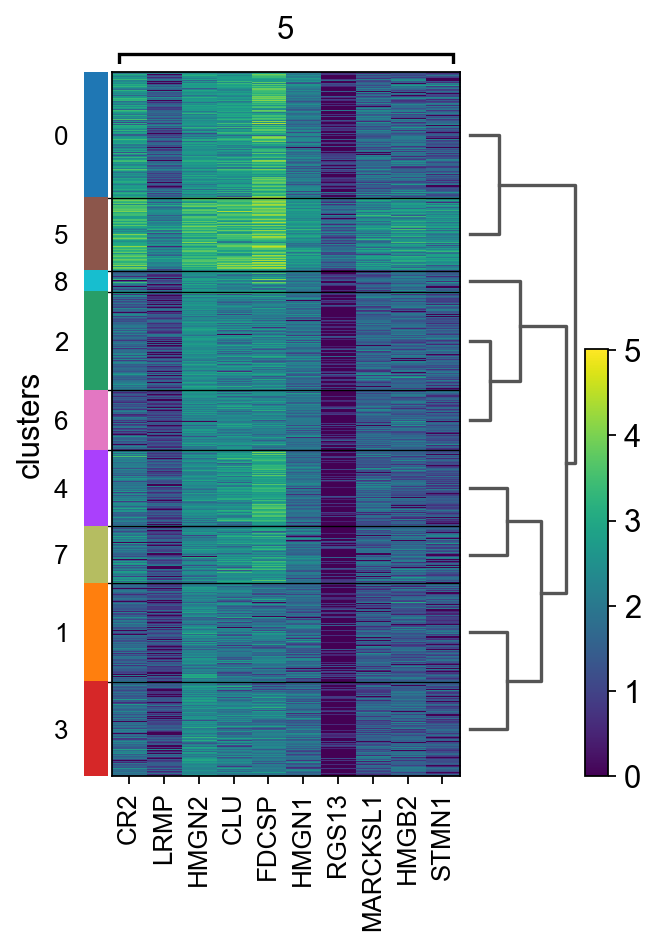

In [13]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups="5", n_genes=10, groupby="clusters")

We see that *CR2* recapitulates the spatial structure.

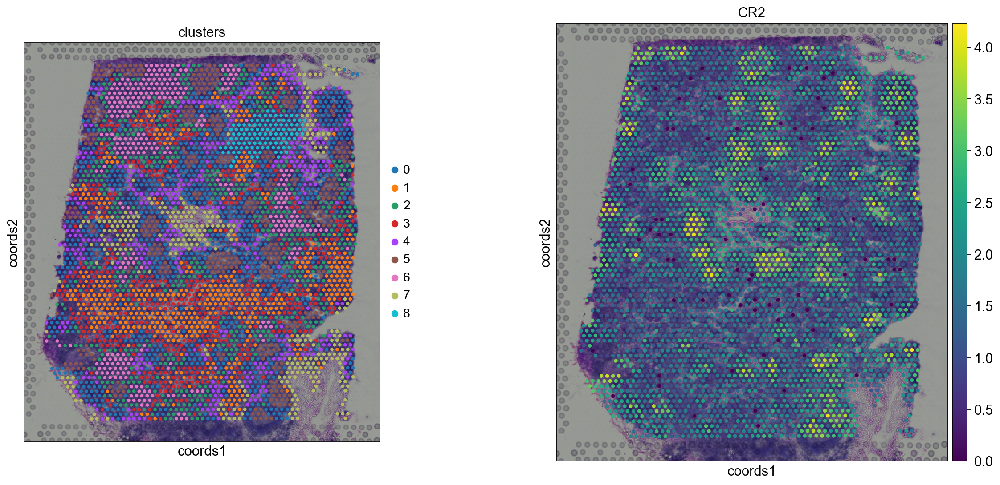

In [14]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "CR2"])

## Spatially variable genes

Spatial transcriptomics allows researchers to investigate how gene expression trends varies in space, thus identifying spatial patterns of gene expression. For this purpose, we use SpatialDE [Svensson18](https://www.nature.com/articles/nmeth.4636) ([code](https://github.com/Teichlab/SpatialDE)), a Gaussian process-based statistical framework that aims to identify spatially variable genes:
```
pip install spatialde
```

Recently, other tools have been proposed for the identification of spatially variable genes, such as:
* **SPARK** [paper](https://www.nature.com/articles/s41592-019-0701-7#Abs1) - [code](https://github.com/xzhoulab/SPARK)
* **trendsceek** [paper](https://www.nature.com/articles/nmeth.4634) - [code](https://github.com/edsgard/trendsceek)
* **HMRF** [paper](https://www.nature.com/articles/nbt.4260) - [code](https://bitbucket.org/qzhudfci/smfishhmrf-py/src/default/)

First, we convert normalized counts and coordinates to pandas dataframe, needed for inputs to spatialDE.

Running SpatialDE takes considerable time.

In [15]:
import SpatialDE

In [16]:
%%time
counts = pd.DataFrame(adata.X.todense(), columns=adata.var_names, index=adata.obs_names)
coord = pd.DataFrame(adata.obsm['coords'], columns=['x_coord', 'y_coord'], index=adata.obs_names)
results = SpatialDE.run(coord, counts)

/Users/giovanni.palla/miniconda3/envs/sc_dev/lib/python3.7/site-packages/SpatialDE/base.py:178: RuntimeWarning: divide by zero encountered in double_scalars
  s2_logdelta = 1. / (derivative(LL_obj, np.log(max_delta), n=2) ** 2)



CPU times: user 1h 46min 30s, sys: 1min 36s, total: 1h 48min 7s
Wall time: 29min 22s


We concatenate the results with the DataFrame of annotations of variables: `adata.var`.

In [17]:
results.index = results["g"]
adata.var = pd.concat([adata.var, results.loc[adata.var.index.values, :]], axis=1)

Then we can inspect significant genes that varies in space and visualize them with `sc.pl.spatial` function.

In [18]:
results.sort_values("qval").head(10)

,FSV,M,g,l,max_delta,max_ll,max_mu_hat,max_s2_t_hat,model,n,s2_FSV,s2_logdelta,time,BIC,max_ll_null,LLR,pval,qval
g,,,,,,,,,,,,,,,,,,
EPHA1,0.092282,4,EPHA1,474.169746,9.649444,-912.478913,0.137565,0.009403,SE,3962,0.000010,0.001217,0.004900,1858.095843,-1002.530494,90.051581,0.0,0.0
CPVL,0.081288,4,CPVL,474.169746,11.087121,-2683.019176,0.398468,0.021507,SE,3962,0.000010,0.001476,0.007711,5399.176370,-2765.035269,82.016093,0.0,0.0
PPIA,0.298773,4,PPIA,474.169746,2.302420,-292.511593,3.092615,0.162267,SE,3962,0.000013,0.000332,0.004567,618.161202,-694.652548,402.140955,0.0,0.0
SAMD9L,0.125077,4,SAMD9L,474.169746,6.862115,-3003.385012,0.585090,0.041092,SE,3962,0.000009,0.000678,0.004271,6039.908042,-3202.809391,199.424379,0.0,0.0
COL1A2,0.090461,4,COL1A2,474.169746,9.863383,-3227.520356,0.740816,0.035660,SE,3962,0.000013,0.001612,0.004311,6488.178728,-3309.702658,82.182302,0.0,0.0
ARPC1B,0.120060,4,ARPC1B,474.169746,7.189890,-2285.547284,1.971545,0.074483,SE,3962,0.000013,0.001034,0.003484,4604.232584,-2412.439643,126.892359,0.0,0.0
ATP5MF,0.069258,4,ATP5MF,474.169746,13.183290,-2610.782278,1.671498,0.048891,SE,3962,0.000009,0.001708,0.012943,5254.702574,-2681.246440,70.464162,0.0,0.0
SYPL1,0.086861,4,SYPL1,474.169746,10.312907,-3329.098692,0.934305,0.039826,SE,3962,0.000012,0.001649,0.009269,6691.335402,-3401.604080,72.505388,0.0,0.0
PARP12,0.072946,4,PARP12,474.169746,12.467190,-3120.296512,0.678568,0.027263,SE,3962,0.000008,0.001420,0.010916,6273.731040,-3202.528124,82.231612,0.0,0.0


... storing 'model' as categorical


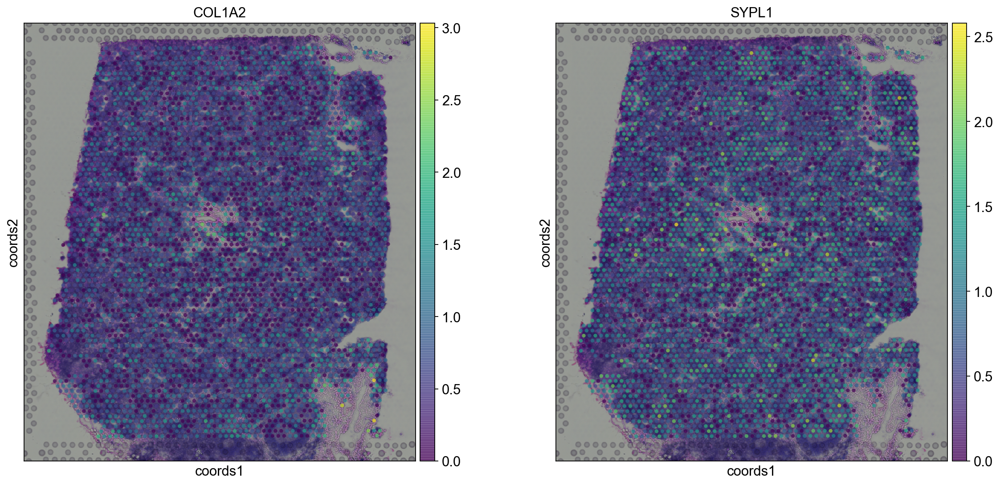

In [19]:
sc.pl.spatial(adata, img_key="hires", color=["COL1A2", "SYPL1"], alpha=0.7)

## MERFISH example

In case you have spatial data generated with FISH-based techniques, just read the cordinate table and assign it to the `adata.obsm` element. 

Let's take a look at the example from [Xia et al. 2019](https://www.pnas.org/content/116/39/19490.abstract).

First, we need to download the coordinate and counts data from the [original publication](https://www.pnas.org/content/116/39/19490/tab-figures-data).

In [20]:
import urllib.request

In [21]:
url_coord = "https://www.pnas.org/highwire/filestream/887973/field_highwire_adjunct_files/15/pnas.1912459116.sd15.xlsx"
filename_coord = "pnas.1912459116.sd15.xlsx"
urllib.request.urlretrieve(url_coord, filename_coord)

('pnas.1912459116.sd15.xlsx', <http.client.HTTPMessage at 0x12e73a150>)

In [22]:
url_counts = "https://www.pnas.org/highwire/filestream/887973/field_highwire_adjunct_files/12/pnas.1912459116.sd12.csv"
filename_counts = "pnas.1912459116.sd12.csv"
urllib.request.urlretrieve(url_counts, filename_counts)

('pnas.1912459116.sd12.csv', <http.client.HTTPMessage at 0x12e74a4d0>)

And read the data in a AnnData object.

In [23]:
coordinates = pd.read_excel("./pnas.1912459116.sd15.xlsx", index_col=0)
counts = sc.read_csv("./pnas.1912459116.sd12.csv").transpose()

In [24]:
adata_merfish = counts[coordinates.index, :]
adata_merfish.obsm["spatial"] = coordinates.to_numpy()

We will perform standard preprocessing and dimensionality reduction.

In [25]:
sc.pp.normalize_per_cell(adata_merfish, counts_per_cell_after=1e6)
sc.pp.log1p(adata_merfish)
sc.pp.pca(adata_merfish, n_comps=15)
sc.pp.neighbors(adata_merfish)
sc.tl.umap(adata_merfish)
sc.tl.leiden(adata_merfish, key_added="clusters", resolution=0.5)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
computing PCA
    with n_comps=15
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 15


/Users/giovanni.palla/miniconda3/envs/sc_dev/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:355: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 11000. The TBB threading layer is disabled.
  warnings.warn(problem)


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 6 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


The experiment consisted in measuring gene expression counts from a single cell type (cultured U2-OS cells). Clusters consist of cell states at different stages of the cell cycle. We don't expect to see specific structure in spatial dimensions given the experimental setup.

We can visualize the clusters obtained from running Leiden in UMAP space and spatial coordinates like this.

In [26]:
adata_merfish

AnnData object with n_obs × n_vars = 645 × 12903
    obs: 'n_counts', 'clusters'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

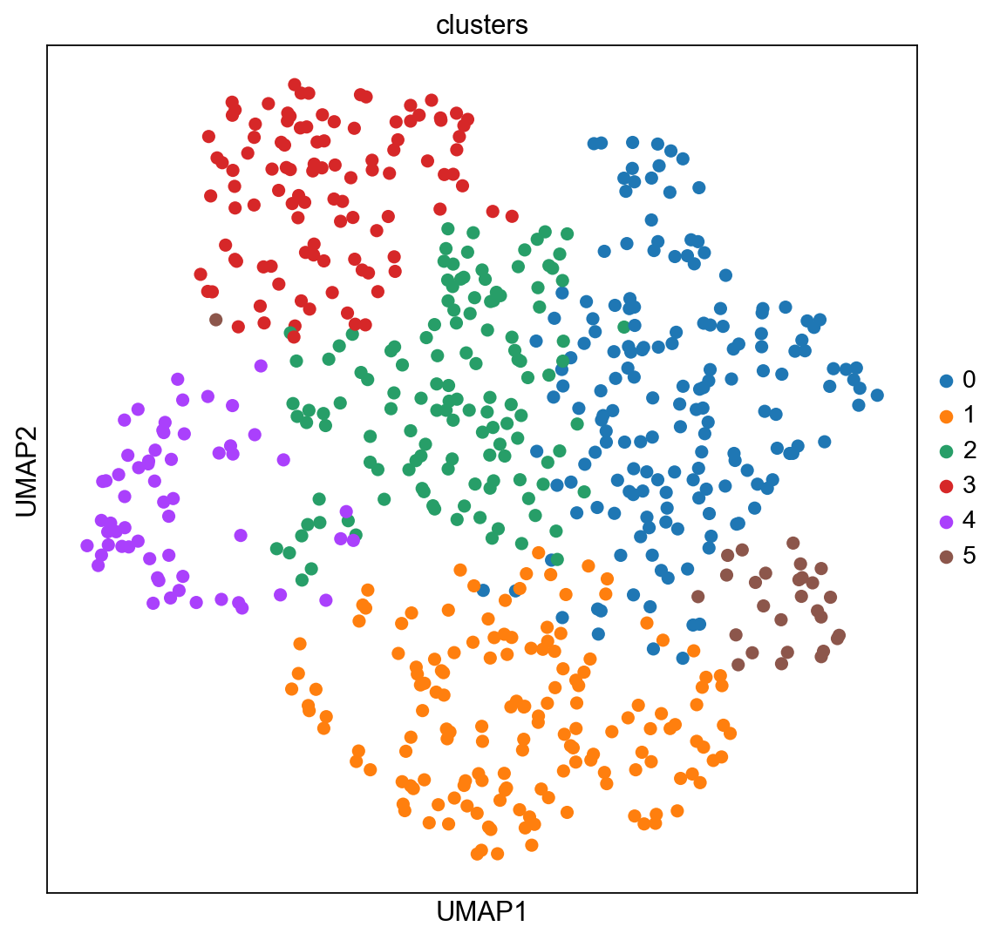

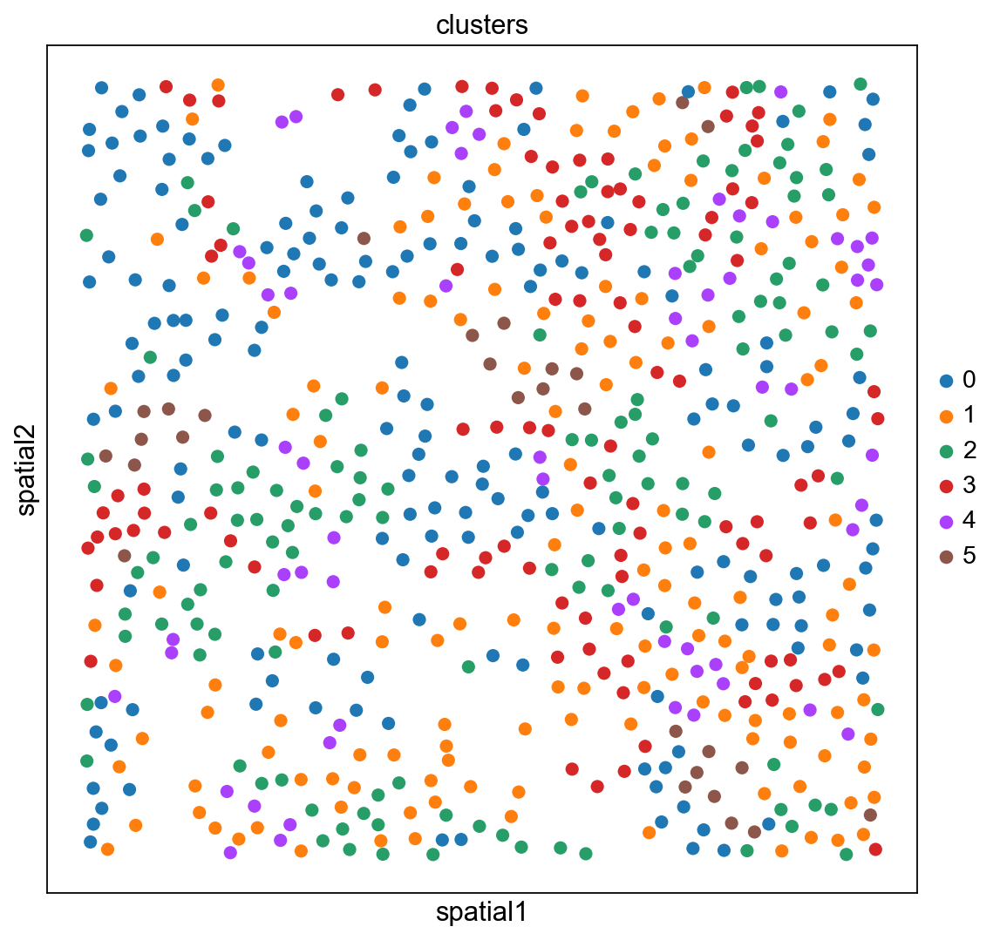

In [27]:
sc.pl.umap(adata_merfish, color="clusters")
sc.pl.embedding(adata_merfish, basis="spatial", color="clusters")

We hope you found the tutorial useful!

[Report back to us](https://github.com/theislab/scanpy/issues/new?labels=enhancement&template=enhancement-request.md) which features/external tools you would like to see in Scanpy. 

We are extending Scanpy and AnnData to support other spatial data types, such as **Imaging Mass Cytometry** and extend data structure to support spatial graphs and additional features. Stay tuned!